In [1]:
import numpy as np
import pandas as pd
import polars as pl
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import cm, colors
from tqdm import tqdm

import glob
import gc
import warnings
import copy
import pathlib
import pickle

import os

from scipy import stats
import signac
import freud
import gsd.hoomd
import hoomd
import schmeud
import schmeud._schmeud as schmeud_rs

from dataclasses import dataclass
from collections import defaultdict

In [2]:
from monk import nb, prep, pair, render, utils, workflow, grid

parent = pathlib.Path(os.getcwd()).parent / "config.yaml"
config = workflow.get_config(parent.as_posix())
parent, config

(PosixPath('/home/ian/Projects/work/monk/workflows/2d-osc-shear/config.yaml'),
 {'root': '/media/ian/Data2/monk/2d-osc-shear',
  'origin': '/media/ian/Data2/monk/2d-esl'})

In [3]:
project: signac.Project = signac.init_project(name="2d-osc-shear", root=config['root'])
project.doc

{'avail_seed': 18, 'dt': 0.005, 'step_unit': 200, 'equil_time': 100, 'min_periods': 20, 'dumps': 40, 'period_times': [30.0, 100.0, 300.0, 1000.0], 'max_shears': [0.01, 0.02, 0.03, 0.05, 0.08, 0.12, 0.04, 0.06, 0.07], '_status': {}}

In [4]:
@dataclass(frozen=True, eq=True)
class Statepoint:
    max_shear: float
    period: float
    temp: float
    prep: str

In [5]:
# get d2min distribution

rev_quant = defaultdict(list)

for job in project:
    print(job)

    expers = sorted(glob.glob(job.fn("no_shear_experiments/*/*/traj-fire_period-*.gsd")))

    if len(expers) == 0:
        continue

    for exper in tqdm(expers):
        max_shear = utils.extract_between(exper, "max-shear-", "/")
        period = utils.extract_between(exper, "period-", ".gsd")
        temp = utils.extract_between(exper, "temp-", "/")
        # sp = Statepoint(max_shear=float(max_shear), period=float(period), temp=float(temp))
        out_path = f"no_shear_experiments/max-shear-{max_shear}/temp-{temp}/d2min-c_period-{period}.parquet"
        
        if float(period) != 1000.0:
            continue

        if job.isfile(out_path):
            continue

        traj = gsd.hoomd.open(exper)

        frames = []
        ids = []
        d2min_irrs = []
        d2min_revs = []
        d2min_cs = []
        for i in range(1, 10):
            
            frames.append(-1 + i*40)
            tags = np.arange(len(traj[i].particles.position))

            snap = traj[-1 + i*40]
            snap_high = traj[9 + i*40]
            snap_later = traj[-1 + (i+1)*40]
            snap_low = traj[29 + i*40]

            box = snap.configuration.box[:]
            box_high = snap_high.configuration.box[:]
            box_later = snap_later.configuration.box[:]
            box_low = snap_low.configuration.box[:]
            ids.append(tags)

            nlist_query = freud.locality.LinkCell.from_system(snap)
            nlist = nlist_query.query(snap.particles.position, {'num_neighbors': 10}).toNeighborList()

            d2min_irr = schmeud_rs.dynamics.d2min_frame(snap.particles.position[:, :2], snap_later.particles.position[:, :2], nlist.query_point_indices, nlist.point_indices, (box, box_later))
            d2min_rev = schmeud_rs.dynamics.d2min_frame(snap_high.particles.position[:, :2], snap_low.particles.position[:, :2], nlist.query_point_indices, nlist.point_indices, (box_high, box_low))
            d2min_c = np.sqrt(np.square(d2min_rev) + np.square(d2min_irr)) * np.sign(d2min_rev - d2min_irr)
            d2min_irrs.append(d2min_irr)
            d2min_revs.append(d2min_rev)
            d2min_cs.append(d2min_c)
        dataset = pl.DataFrame({"frame": frames, "id": ids, "d2min_irr": d2min_irrs, "d2min_rev": d2min_revs, "d2min_c": d2min_cs})
        dataset.write_parquet(job.fn(out_path), use_pyarrow=True)
    #     break
    # break

634e14bc75836df75158fb15f379d8bb


100%|██████████| 13/13 [00:43<00:00,  3.31s/it]


7ec2f6aca035e69077eab24383a21cb6


100%|██████████| 13/13 [00:46<00:00,  3.56s/it]


cfa1e4c0007fd65d020f809715a6f0b4


100%|██████████| 13/13 [00:46<00:00,  3.56s/it]


ecce68c50e28a33684826f28780bf6e9


100%|██████████| 13/13 [00:42<00:00,  3.30s/it]


1d0fe2ba44a6f635f5504dcbcee0ebc9


100%|██████████| 13/13 [00:45<00:00,  3.51s/it]


1083a2a09eec2c6cf215ebc7a9706cac


100%|██████████| 13/13 [00:45<00:00,  3.51s/it]


09d3dccc56f1fa9330b57901cd232ab7


100%|██████████| 13/13 [00:44<00:00,  3.46s/it]


6976a7c10ada4159010403f8027f3ea5


100%|██████████| 13/13 [00:42<00:00,  3.26s/it]


9158e73b2e4c9fd1a565e1e5d1bc3af5


100%|██████████| 13/13 [00:42<00:00,  3.29s/it]


c6d7afd0de62bfa16d05da47815227eb


100%|██████████| 13/13 [00:44<00:00,  3.43s/it]


bf92a185d043ce3ef666e05e427c7e76


100%|██████████| 13/13 [00:44<00:00,  3.40s/it]


a8f2c249ed85533b56b0729b7ab96d18


100%|██████████| 13/13 [00:43<00:00,  3.36s/it]


In [6]:
output = defaultdict(list)

for job in project:
    print(job)
    prep = job.sp.prep

    expers = sorted(glob.glob(job.fn("no_shear_experiments/*/*/traj-fire_period-*.gsd")))
    # other_expers = sorted(glob.glob(job.fn("aqs_therm_experiments/*/*/traj-fire_period-*.gsd")))
    # expers += other_expers
    expers = sorted(expers)

    for exper in expers:
        max_shear = utils.extract_between(exper, "max-shear-", "/")
        period = utils.extract_between(exper, "period-", ".gsd")
        temp = utils.extract_between(exper, "temp-", "/")
        sp = Statepoint(max_shear=float(max_shear), period=float(period), temp=float(temp), prep=prep)
        # d2min_path = f"longer_experiments/max-shear-{max_shear}/temp-{temp}/d2min-c_period-{period}.parquet"
        # soft_strob = f"longer_experiments/max-shear-{max_shear}/temp-{temp}/strob-softness_period-{period}.parquet"
        d2min_path = exper.replace(f"traj-fire_period-{period}.gsd", f"d2min-c_period-{period}.parquet")
        soft_strob = exper.replace(f"traj-fire_period-{period}.gsd", f"strob-softness_period-{period}.parquet")

        # print(temp)
        
        if float(period) != 1000.0:
            continue

        df_d2min = pl.read_parquet(job.fn(d2min_path))
        df_soft = pl.read_parquet(job.fn(soft_strob))
        df_soft = df_soft.rename({"id": "typeid"})
        # join dfs
        df = df_d2min.join(df_soft, on="frame")
        output[sp].append(df)
        # break
    # break

634e14bc75836df75158fb15f379d8bb
7ec2f6aca035e69077eab24383a21cb6
cfa1e4c0007fd65d020f809715a6f0b4
ecce68c50e28a33684826f28780bf6e9
1d0fe2ba44a6f635f5504dcbcee0ebc9
1083a2a09eec2c6cf215ebc7a9706cac
09d3dccc56f1fa9330b57901cd232ab7
6976a7c10ada4159010403f8027f3ea5
9158e73b2e4c9fd1a565e1e5d1bc3af5
c6d7afd0de62bfa16d05da47815227eb
bf92a185d043ce3ef666e05e427c7e76
a8f2c249ed85533b56b0729b7ab96d18


/tmp/ipykernel_2267510/1188662073.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2, figsize=(12, 5))


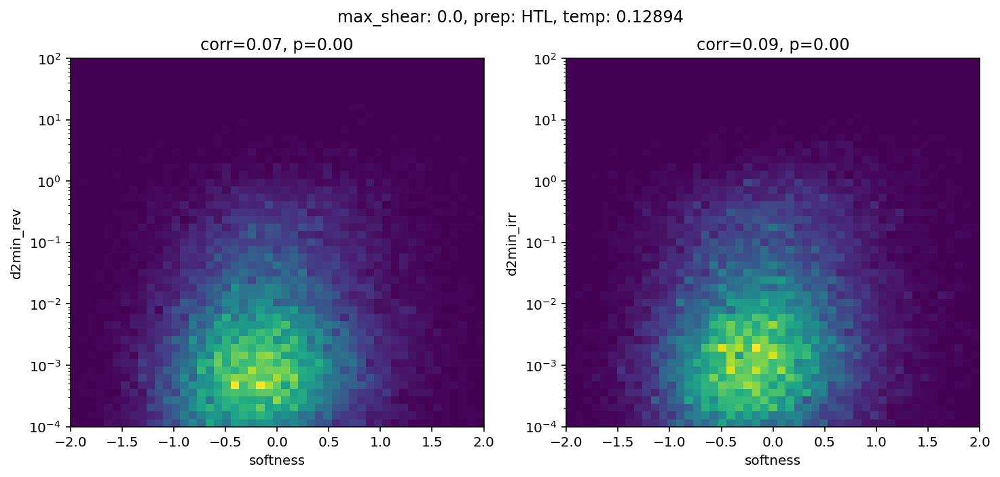

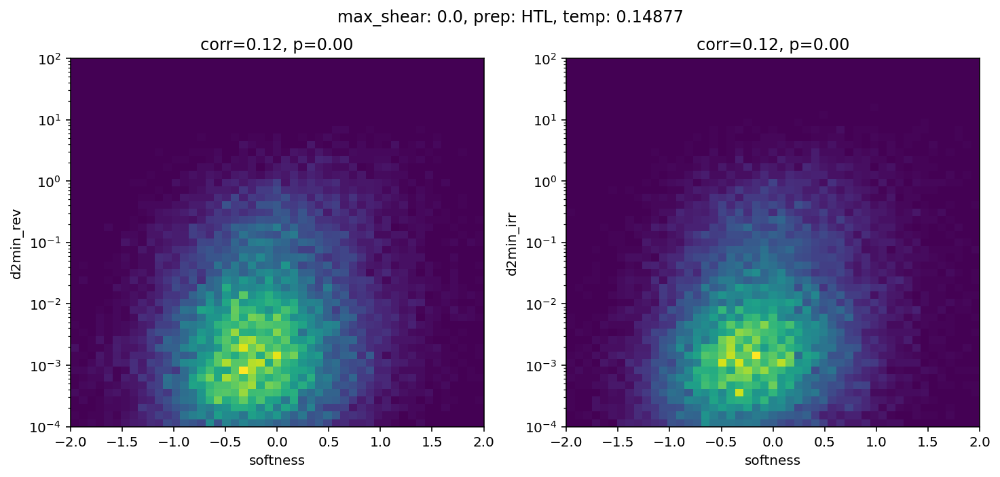

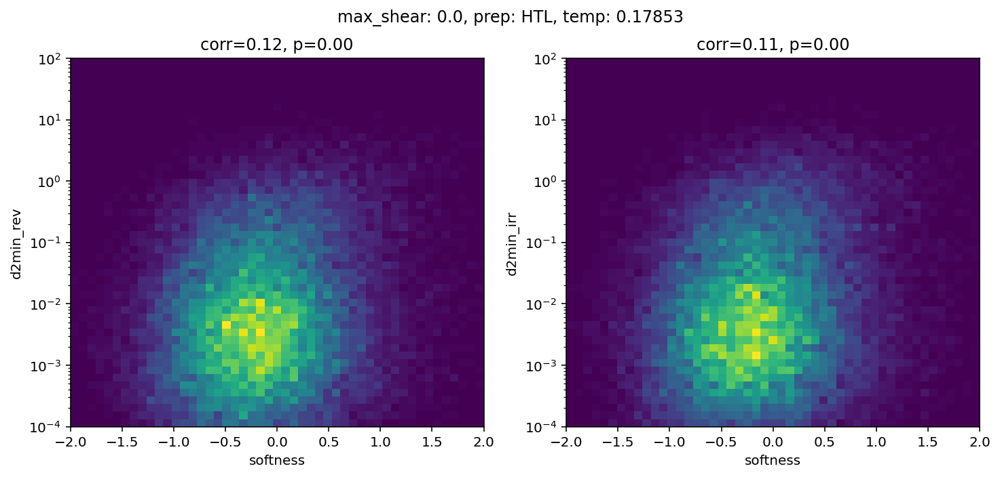

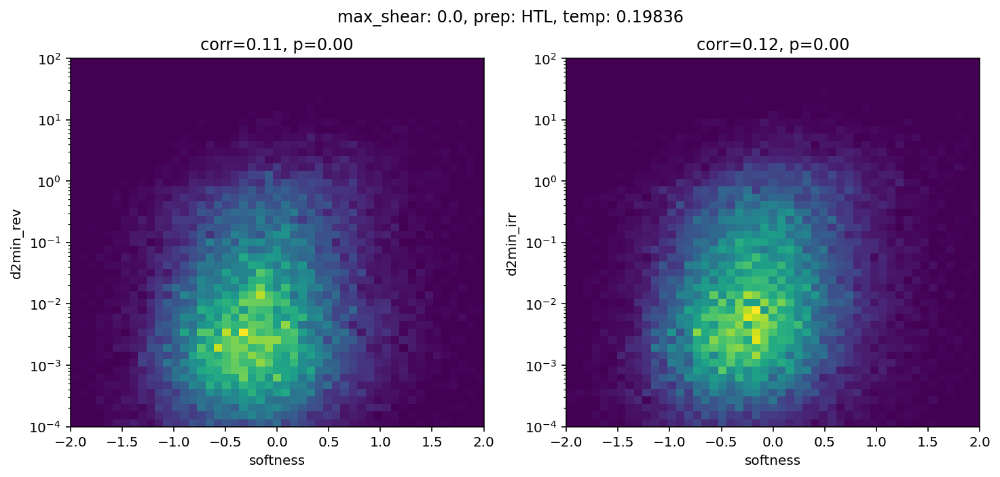

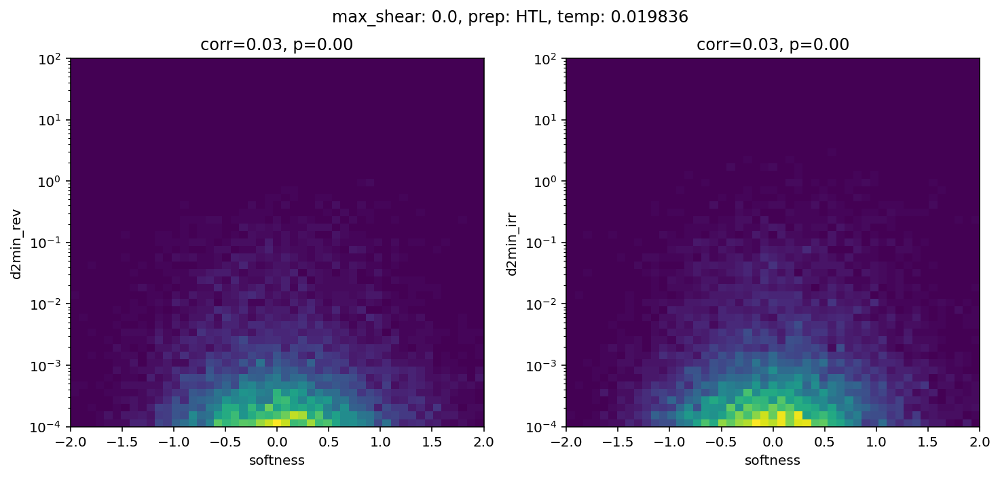

...

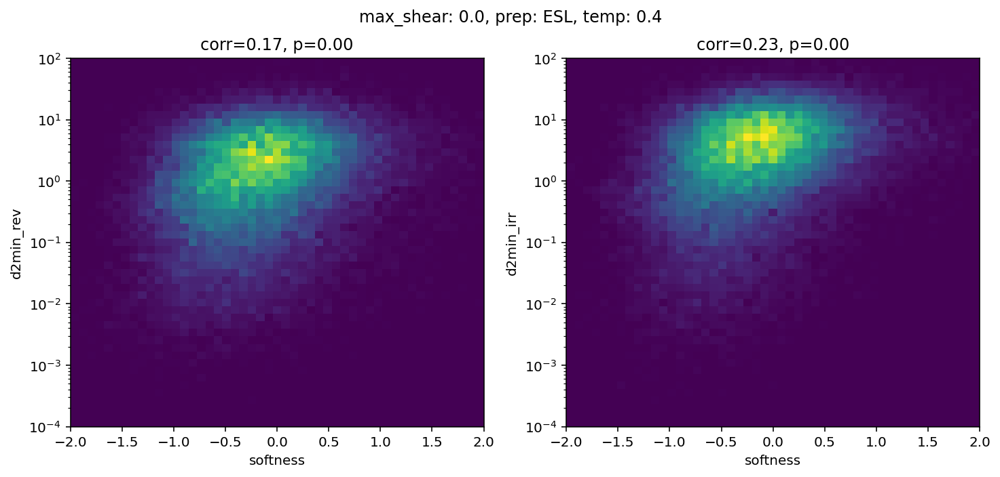

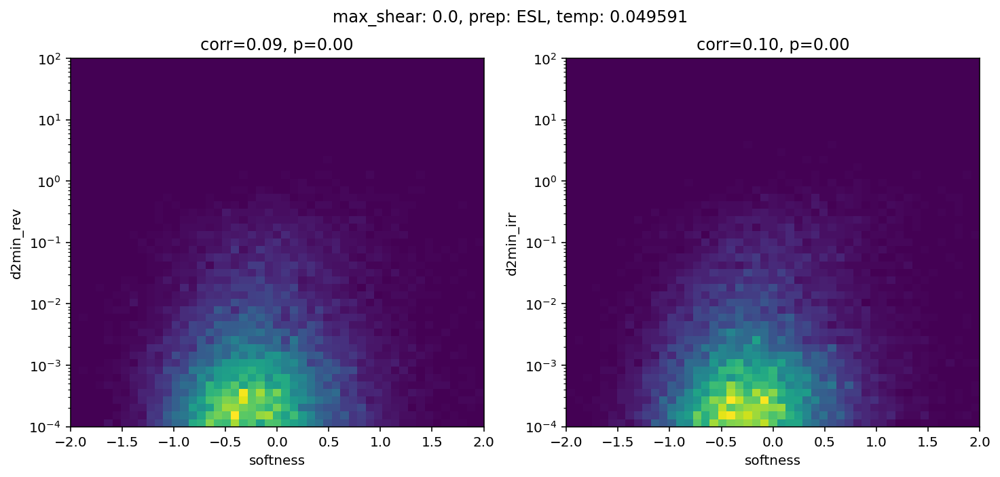

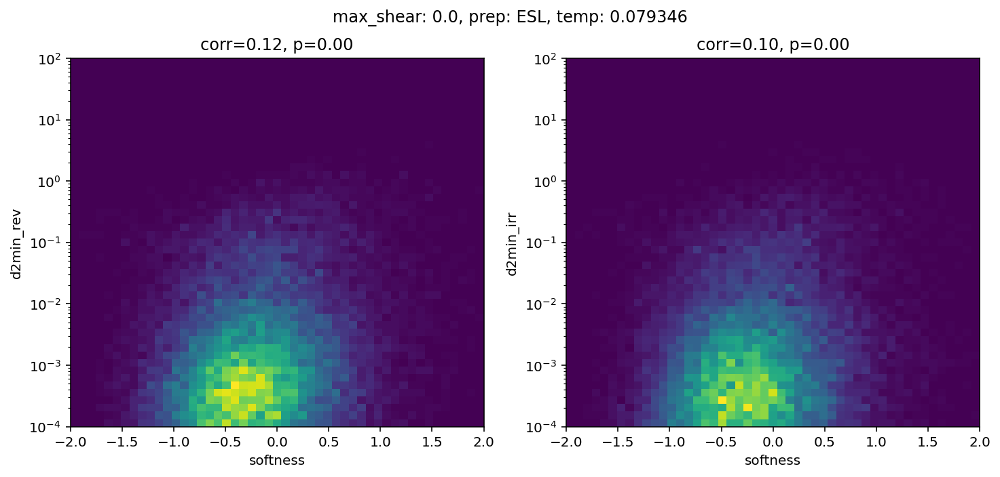

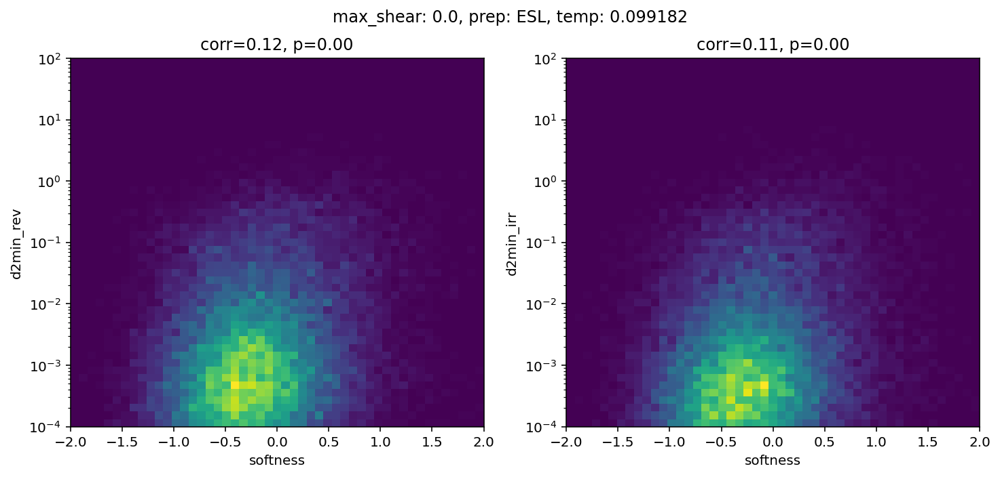

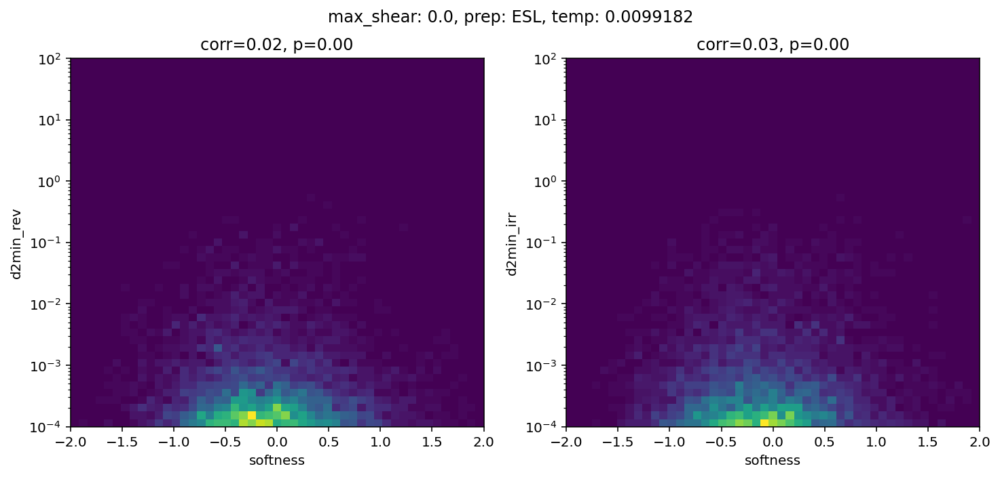

In [7]:
x = np.linspace(-2, 2, 50)
y = np.geomspace(1e-4, 100, 50)
bins = [x, y]
for sp, dfs in list(output.items()):
    df = dfs[0]
    # print(stats.pearsonr(df["soft"], df["d2min_c"]))
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
 
    axs[0].hist2d(df["soft"][-1], df["d2min_rev"][-1], bins=bins)
    axs[1].hist2d(df["soft"][-1], df["d2min_irr"][-1], bins=bins)
    corr1 = stats.pearsonr(df["soft"][-1], df["d2min_rev"][-1])
    corr2 = stats.pearsonr(df["soft"][-1], df["d2min_irr"][-1])

    axs[0].set_yscale('log')
    axs[1].set_yscale('log')

    for ax in axs:
        ax.set_xlabel("softness")
    axs[0].set_ylabel("d2min_rev")
    axs[0].set_title(f"corr={corr1[0]:.2f}, p={corr1[1]:.2f}")
    axs[1].set_ylabel("d2min_irr")
    axs[1].set_title(f"corr={corr2[0]:.2f}, p={corr2[1]:.2f}")
    plt.suptitle(f"max_shear: {sp.max_shear}, prep: {sp.prep}, temp: {sp.temp}")
    # plt.show()
    # break

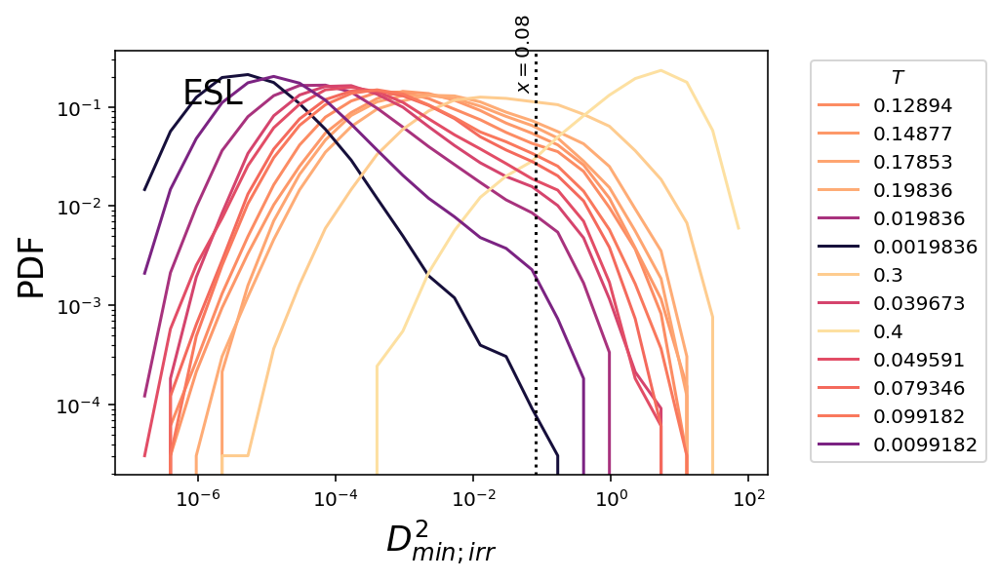

In [21]:
x = np.linspace(-2, 2, 50)
y = np.geomspace(1e-7, 100, 25)
cmap = cm.magma
norm = colors.LogNorm(vmin=0.001, vmax=0.6)
bins = [x, y]
for sp, dfs in list(output.items()):

    # if sp.temp != 0.019836:
    #     continue

    # if sp.max_shear != 0.08:
    #     continue

    if sp.prep == "ESL":
        ls = "-"
    else:
        # ls = ":"
        continue

    df = dfs[0]
    H, _ = np.histogram(df["d2min_irr"][-1], bins=y)
    H = H / np.sum(H)
    plt.plot((y[1:] + y[:-1])/2, H, label=f"{sp.temp}", ls=ls, color=cmap(norm(sp.temp)))
    # print(stats.pearsonr(df["soft"], df["d2min_c"]))
    # fig, axs = plt.subplots(1, 2, figsize=(12, 5))
 
    # axs[0].hist2d(df["soft"][-1], df["d2min_rev"][-1], bins=bins)
    # axs[1].hist2d(df["soft"][-1], df["d2min_irr"][-1], bins=bins)
    # corr1 = stats.pearsonr(df["soft"][-1], df["d2min_rev"][-1])
    # corr2 = stats.pearsonr(df["soft"][-1], df["d2min_irr"][-1])

    # axs[0].set_yscale('log')
    # axs[1].set_yscale('log')

    # for ax in axs:
    #     ax.set_xlabel("softness")
    # axs[0].set_ylabel("d2min_rev")
    # axs[0].set_title(f"corr={corr1[0]:.2f}, p={corr1[1]:.2f}")
    # axs[1].set_ylabel("d2min_irr")
    # axs[1].set_title(f"corr={corr2[0]:.2f}, p={corr2[1]:.2f}")
    # plt.suptitle(f"max_shear: {sp.max_shear}, prep: {sp.prep}, temp: {sp.temp}")
    # plt.show()
    # break
plt.yscale('log')
lims = plt.ylim()
plt.vlines(0.08, *lims, "k", ls=":")
plt.ylim(*lims)
plt.xscale('log')
plt.legend(title=r"$T$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel(r"$D^2_{min;irr}$", size="xx-large")
plt.ylabel("PDF", size="xx-large")
plt.text(0.15, 0.9, r"ESL", transform=plt.gca().transAxes, ha="center", va="center", size="xx-large")
plt.text(0.04, 0.15, r"$x=0.08$", rotation=90)
plt.savefig("d2min_irr_esl.png", dpi=300, bbox_inches="tight")

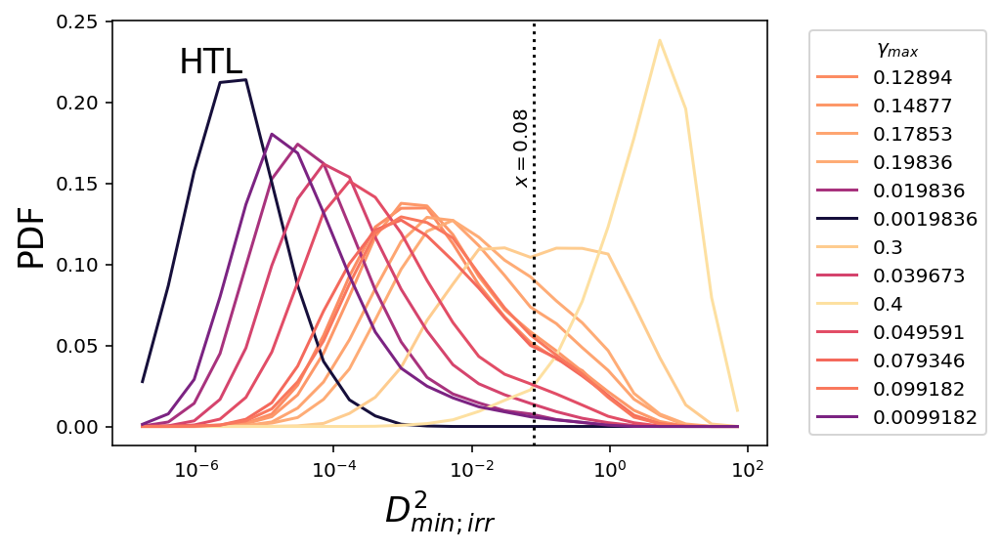

In [22]:
x = np.linspace(-2, 2, 50)
y = np.geomspace(1e-7, 100, 25)
cmap = cm.magma
norm = colors.LogNorm(vmin=0.001, vmax=0.6)
bins = [x, y]
for sp, dfs in list(output.items()):

    # if sp.max_shear != 0.08:
    #     continue

    if sp.prep == "HTL":
        ls = "-"
    else:
        # ls = ":"
        continue

    df = dfs[0]
    H, _ = np.histogram(df["d2min_irr"][-1], bins=y)
    H = H / np.sum(H)
    plt.plot((y[1:] + y[:-1])/2, H, label=f"{sp.temp}", ls=ls, color=cmap(norm(sp.temp)))
    # print(stats.pearsonr(df["soft"], df["d2min_c"]))
    # fig, axs = plt.subplots(1, 2, figsize=(12, 5))
 
    # axs[0].hist2d(df["soft"][-1], df["d2min_rev"][-1], bins=bins)
    # axs[1].hist2d(df["soft"][-1], df["d2min_irr"][-1], bins=bins)
    # corr1 = stats.pearsonr(df["soft"][-1], df["d2min_rev"][-1])
    # corr2 = stats.pearsonr(df["soft"][-1], df["d2min_irr"][-1])

    # axs[0].set_yscale('log')
    # axs[1].set_yscale('log')

    # for ax in axs:
    #     ax.set_xlabel("softness")
    # axs[0].set_ylabel("d2min_rev")
    # axs[0].set_title(f"corr={corr1[0]:.2f}, p={corr1[1]:.2f}")
    # axs[1].set_ylabel("d2min_irr")
    # axs[1].set_title(f"corr={corr2[0]:.2f}, p={corr2[1]:.2f}")
    # plt.suptitle(f"max_shear: {sp.max_shear}, prep: {sp.prep}, temp: {sp.temp}")
    # plt.show()
    # break
lims = plt.ylim()
plt.vlines(0.08, *lims, "k", ls=":")
plt.ylim(*lims)
# plt.yscale('log')
plt.xscale('log')
plt.legend(title=r"$\gamma_{max}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel(r"$D^2_{min;irr}$", size="xx-large")
plt.ylabel("PDF", size="xx-large")
plt.text(0.15, 0.9, r"HTL", transform=plt.gca().transAxes, ha="center", va="center", size="xx-large")
plt.text(0.04, 0.15, r"$x=0.08$", rotation=90)
plt.savefig("d2min_irr_htl.png", dpi=300, bbox_inches="tight")

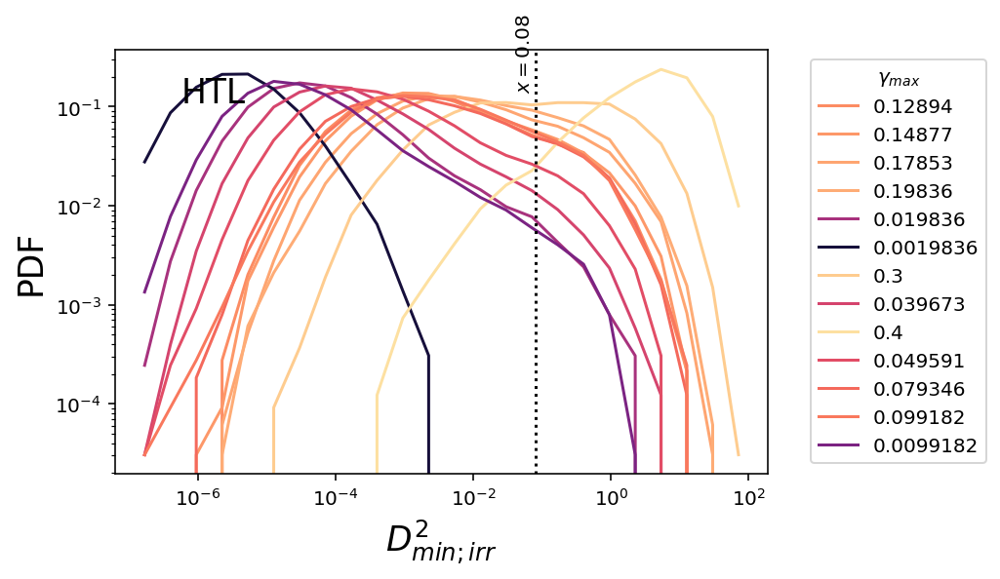

In [23]:
x = np.linspace(-2, 2, 50)
y = np.geomspace(1e-7, 100, 25)
cmap = cm.magma
norm = colors.LogNorm(vmin=0.001, vmax=0.6)
bins = [x, y]
for sp, dfs in list(output.items()):

    # if sp.max_shear != 0.08:
    #     continue

    if sp.prep == "HTL":
        ls = "-"
    else:
        # ls = ":"
        continue

    df = dfs[0]
    H, _ = np.histogram(df["d2min_irr"][-1], bins=y)
    H = H / np.sum(H)
    plt.plot((y[1:] + y[:-1])/2, H, label=f"{sp.temp}", ls=ls, color=cmap(norm(sp.temp)))
    # print(stats.pearsonr(df["soft"], df["d2min_c"]))
    # fig, axs = plt.subplots(1, 2, figsize=(12, 5))
 
    # axs[0].hist2d(df["soft"][-1], df["d2min_rev"][-1], bins=bins)
    # axs[1].hist2d(df["soft"][-1], df["d2min_irr"][-1], bins=bins)
    # corr1 = stats.pearsonr(df["soft"][-1], df["d2min_rev"][-1])
    # corr2 = stats.pearsonr(df["soft"][-1], df["d2min_irr"][-1])

    # axs[0].set_yscale('log')
    # axs[1].set_yscale('log')

    # for ax in axs:
    #     ax.set_xlabel("softness")
    # axs[0].set_ylabel("d2min_rev")
    # axs[0].set_title(f"corr={corr1[0]:.2f}, p={corr1[1]:.2f}")
    # axs[1].set_ylabel("d2min_irr")
    # axs[1].set_title(f"corr={corr2[0]:.2f}, p={corr2[1]:.2f}")
    # plt.suptitle(f"max_shear: {sp.max_shear}, prep: {sp.prep}, temp: {sp.temp}")
    # plt.show()
    # break
plt.yscale('log')
lims = plt.ylim()
plt.vlines(0.08, *lims, "k", ls=":")
plt.ylim(*lims)

plt.xscale('log')
plt.legend(title=r"$\gamma_{max}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel(r"$D^2_{min;irr}$", size="xx-large")
plt.ylabel("PDF", size="xx-large")
plt.text(0.15, 0.9, r"HTL", transform=plt.gca().transAxes, ha="center", va="center", size="xx-large")
plt.text(0.04, 0.15, r"$x=0.08$", rotation=90)
plt.savefig("d2min_irr_htl.png", dpi=300, bbox_inches="tight")

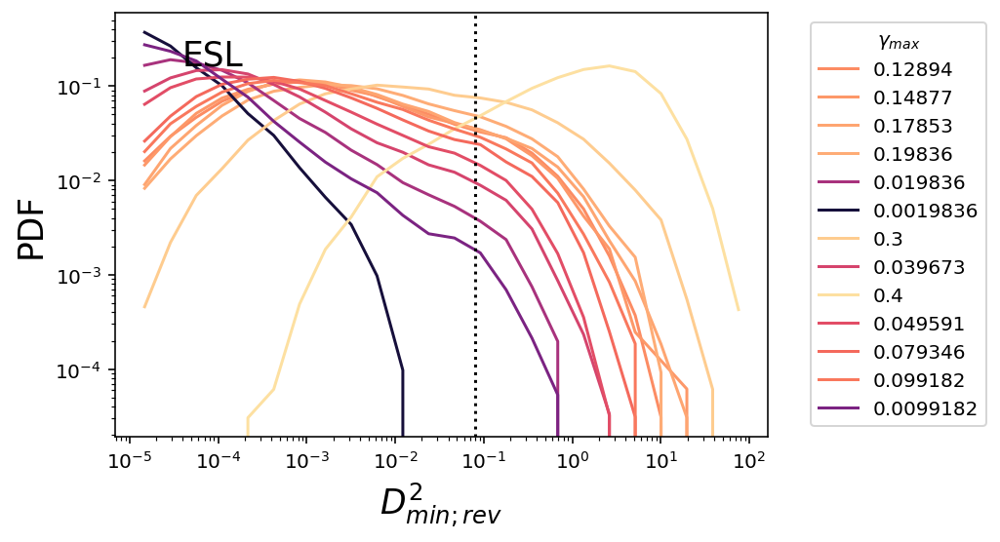

In [24]:
x = np.linspace(-2, 2, 50)
y = np.geomspace(1e-5, 100, 25)
cmap = cm.magma
norm = colors.LogNorm(vmin=0.001, vmax=0.6)
bins = [x, y]
for sp, dfs in list(output.items()):

    # if sp.temp != 0.019836:
    #     continue

    # if sp.max_shear != 0.08:
    #     continue

    if sp.prep == "ESL":
        ls = "-"
    else:
        # ls = ":"
        continue

    df = dfs[0]
    H, _ = np.histogram(df["d2min_rev"][-1], bins=y)
    H = H / np.sum(H)
    plt.plot((y[1:] + y[:-1])/2, H, label=f"{sp.temp}", ls=ls, color=cmap(norm(sp.temp)))
    # print(stats.pearsonr(df["soft"], df["d2min_c"]))
    # fig, axs = plt.subplots(1, 2, figsize=(12, 5))
 
    # axs[0].hist2d(df["soft"][-1], df["d2min_rev"][-1], bins=bins)
    # axs[1].hist2d(df["soft"][-1], df["d2min_irr"][-1], bins=bins)
    # corr1 = stats.pearsonr(df["soft"][-1], df["d2min_rev"][-1])
    # corr2 = stats.pearsonr(df["soft"][-1], df["d2min_irr"][-1])

    # axs[0].set_yscale('log')
    # axs[1].set_yscale('log')

    # for ax in axs:
    #     ax.set_xlabel("softness")
    # axs[0].set_ylabel("d2min_rev")
    # axs[0].set_title(f"corr={corr1[0]:.2f}, p={corr1[1]:.2f}")
    # axs[1].set_ylabel("d2min_irr")
    # axs[1].set_title(f"corr={corr2[0]:.2f}, p={corr2[1]:.2f}")
    # plt.suptitle(f"max_shear: {sp.max_shear}, prep: {sp.prep}, temp: {sp.temp}")
    # plt.show()
    # break
plt.yscale('log')
lims = plt.ylim()
plt.vlines(0.08, *lims, "k", ls=":")
plt.ylim(*lims)
plt.xscale('log')
plt.legend(title=r"$\gamma_{max}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel(r"$D^2_{min;rev}$", size="xx-large")
plt.ylabel("PDF", size="xx-large")
plt.text(0.15, 0.9, r"ESL", transform=plt.gca().transAxes, ha="center", va="center", size="xx-large")
# plt.text(0.04, 0.21, r"$x=0.08$", rotation=90)
plt.savefig("d2min_rev_esl.png", dpi=300, bbox_inches="tight")

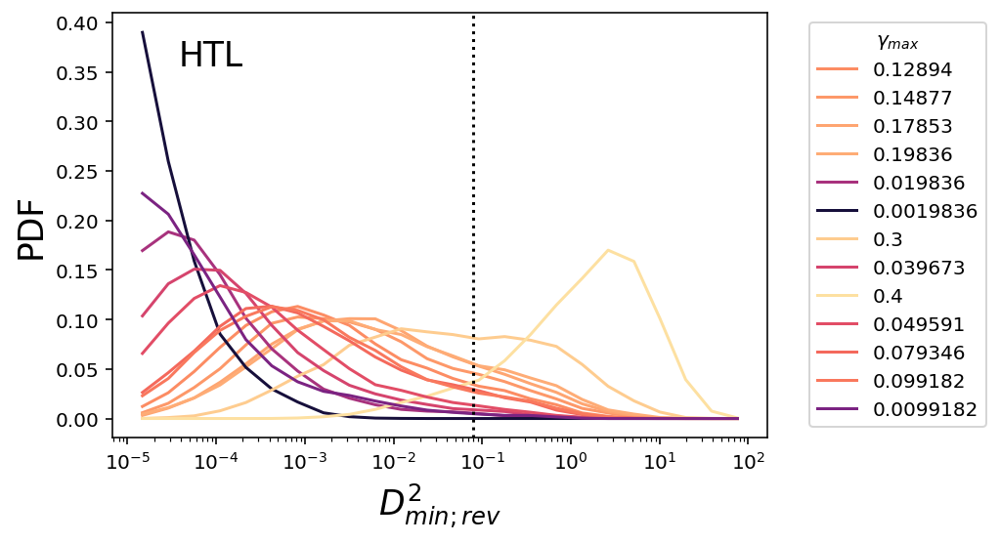

In [27]:
x = np.linspace(-2, 2, 50)
y = np.geomspace(1e-5, 100, 25)
cmap = cm.magma
norm = colors.LogNorm(vmin=0.001, vmax=0.6)
bins = [x, y]
for sp, dfs in list(output.items()):

    # if sp.temp != 0.019836:
    #     continue

    # if sp.max_shear != 0.08:
    #     continue

    if sp.prep == "HTL":
        ls = "-"
    else:
        # ls = ":"
        continue

    df = dfs[0]
    H, _ = np.histogram(df["d2min_rev"][-1], bins=y)
    H = H / np.sum(H)
    plt.plot((y[1:] + y[:-1])/2, H, label=f"{sp.temp}", ls=ls, color=cmap(norm(sp.temp)))
    # print(stats.pearsonr(df["soft"], df["d2min_c"]))
    # fig, axs = plt.subplots(1, 2, figsize=(12, 5))
 
    # axs[0].hist2d(df["soft"][-1], df["d2min_rev"][-1], bins=bins)
    # axs[1].hist2d(df["soft"][-1], df["d2min_irr"][-1], bins=bins)
    # corr1 = stats.pearsonr(df["soft"][-1], df["d2min_rev"][-1])
    # corr2 = stats.pearsonr(df["soft"][-1], df["d2min_irr"][-1])

    # axs[0].set_yscale('log')
    # axs[1].set_yscale('log')

    # for ax in axs:
    #     ax.set_xlabel("softness")
    # axs[0].set_ylabel("d2min_rev")
    # axs[0].set_title(f"corr={corr1[0]:.2f}, p={corr1[1]:.2f}")
    # axs[1].set_ylabel("d2min_irr")
    # axs[1].set_title(f"corr={corr2[0]:.2f}, p={corr2[1]:.2f}")
    # plt.suptitle(f"max_shear: {sp.max_shear}, prep: {sp.prep}, temp: {sp.temp}")
    # plt.show()
    # break
# plt.yscale('log')
lims = plt.ylim()
plt.vlines(0.08, *lims, "k", ls=":")
plt.ylim(*lims)
plt.xscale('log')
plt.legend(title=r"$\gamma_{max}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel(r"$D^2_{min;rev}$", size="xx-large")
plt.ylabel("PDF", size="xx-large")
plt.text(0.15, 0.9, r"HTL", transform=plt.gca().transAxes, ha="center", va="center", size="xx-large")
# plt.text(0.04, 0.21, r"$x=0.08$", rotation=90)
plt.savefig("d2min_rev_htl.png", dpi=300, bbox_inches="tight")

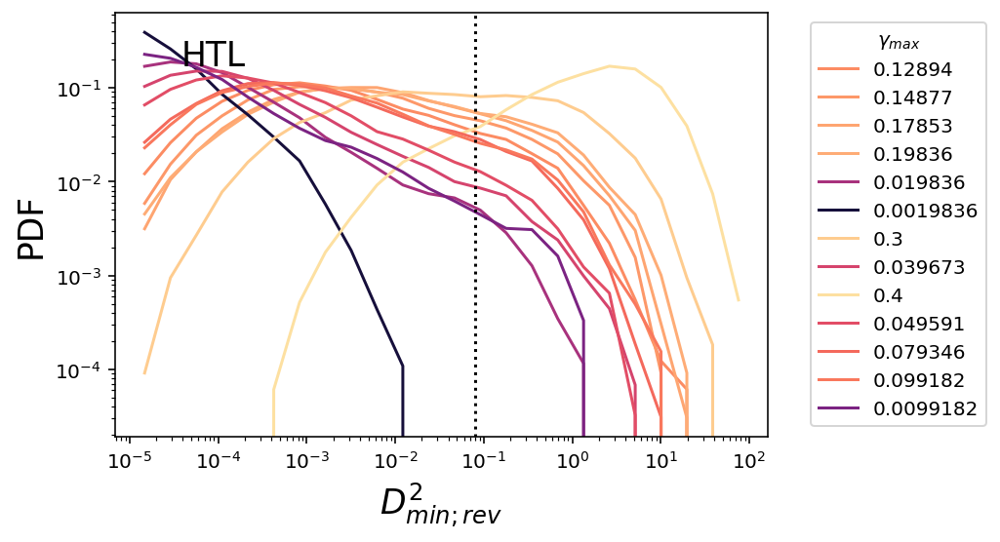

In [28]:
x = np.linspace(-2, 2, 50)
y = np.geomspace(1e-5, 100, 25)
cmap = cm.magma
norm = colors.LogNorm(vmin=0.001, vmax=0.6)
bins = [x, y]
for sp, dfs in list(output.items()):

    # if sp.temp != 0.019836:
    #     continue

    # if sp.max_shear != 0.08:
    #     continue

    if sp.prep == "HTL":
        ls = "-"
    else:
        # ls = ":"
        continue

    df = dfs[0]
    H, _ = np.histogram(df["d2min_rev"][-1], bins=y)
    H = H / np.sum(H)
    plt.plot((y[1:] + y[:-1])/2, H, label=f"{sp.temp}", ls=ls, color=cmap(norm(sp.temp)))
    # print(stats.pearsonr(df["soft"], df["d2min_c"]))
    # fig, axs = plt.subplots(1, 2, figsize=(12, 5))
 
    # axs[0].hist2d(df["soft"][-1], df["d2min_rev"][-1], bins=bins)
    # axs[1].hist2d(df["soft"][-1], df["d2min_irr"][-1], bins=bins)
    # corr1 = stats.pearsonr(df["soft"][-1], df["d2min_rev"][-1])
    # corr2 = stats.pearsonr(df["soft"][-1], df["d2min_irr"][-1])

    # axs[0].set_yscale('log')
    # axs[1].set_yscale('log')

    # for ax in axs:
    #     ax.set_xlabel("softness")
    # axs[0].set_ylabel("d2min_rev")
    # axs[0].set_title(f"corr={corr1[0]:.2f}, p={corr1[1]:.2f}")
    # axs[1].set_ylabel("d2min_irr")
    # axs[1].set_title(f"corr={corr2[0]:.2f}, p={corr2[1]:.2f}")
    # plt.suptitle(f"max_shear: {sp.max_shear}, prep: {sp.prep}, temp: {sp.temp}")
    # plt.show()
    # break
plt.yscale('log')
lims = plt.ylim()
plt.vlines(0.08, *lims, "k", ls=":")
plt.ylim(*lims)
plt.xscale('log')
plt.legend(title=r"$\gamma_{max}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel(r"$D^2_{min;rev}$", size="xx-large")
plt.ylabel("PDF", size="xx-large")
plt.text(0.15, 0.9, r"HTL", transform=plt.gca().transAxes, ha="center", va="center", size="xx-large")
# plt.text(0.04, 0.21, r"$x=0.08$", rotation=90)
plt.savefig("d2min_rev_htl.png", dpi=300, bbox_inches="tight")

In [28]:
sp

Statepoint(max_shear=0.01, period=1000.0, temp=0.1984, prep='HTL')

In [29]:
new_dfs.head()

frame,id,d2min_irr,d2min_rev,d2min_c,typeid,soft
i64,list[i64],list[f32],list[f32],list[f32],list[u32],list[f32]


In [37]:
temps = []
for sp, dfs in list(output.items()):
    temps.append(sp.temp)
temps = sorted(np.unique(temps))
temps

[0.0019836,
 0.0099182,
 0.019836,
 0.039673,
 0.049591,
 0.079346,
 0.099182,
 0.12894,
 0.14877,
 0.17853,
 0.19836,
 0.3,
 0.4]

In [38]:
len(temps)

13

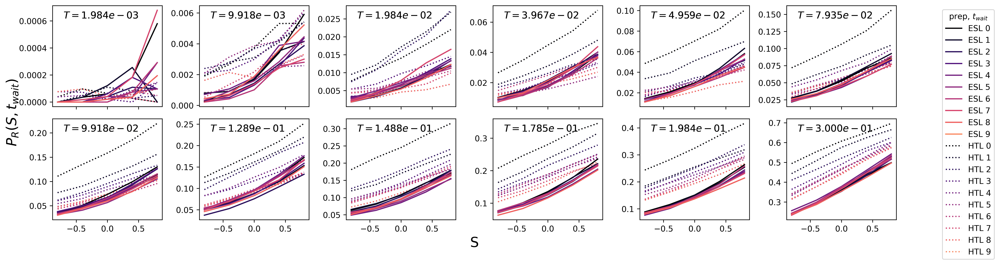

In [40]:
x = np.linspace(-1., 1., 6)
x2 = (x[1:] + x[:-1]) / 2
l = [f"{x:.2f}" for x in x2]
l.insert(0, "-inf")
l.append("inf")
y = np.geomspace(1e-4, 100, 50)
bins = [x, y]
df: pl.DataFrame

# shear = 0.03
# temp = 0.019836

cmap = cm.magma
norm = colors.Normalize(vmin=0, vmax=12)

# shears = [0.01, 0.02, 0.03, 0.12]
# tpre = ["100", "10"]

fig, axs = plt.subplots(2, 6, figsize=(18, 5), sharex=True, sharey=False, dpi=300)

axs = axs.ravel()

plt.subplots_adjust(wspace=.15, hspace=0)

for i in range(12):
    # shear = shears[i]
    temp = temps[i]
    # tp = tpre[j]
    plt.sca(axs[i])
    for sp, dfs in list(output.items()):

        if sp.temp != temp:
            continue
        
        # if sp.max_shear != shear:
        #     continue
        
        if sp.prep == "ESL":
            ls = "-"
        else:
            ls = ":"

        # df = dfs[0]
        # df = df.clone()
        # print(stats.pearsonr(df["soft"], df["d2min_c"]))
        # fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        

        for jdx in np.arange(0, 10):

            # xo = []
            # yo = []
            new_dfs = []
            for idx in np.arange(jdx, jdx+1, dtype=int):
                idx = int(idx)

                
                # print(idx)
                for kdx in range(len(dfs)):
                    new_dfs.append(dfs[kdx][idx])

            new_dfs = pl.concat(new_dfs)

            soft = new_dfs["soft"].explode()

            rev_d2min = new_dfs["d2min_rev"].explode()

            rearrange = rev_d2min > 0.08

            cuts = soft.cut(x, labels=l)

            df2 = pl.DataFrame(dict(
                soft=soft,
                d2min_rev=rev_d2min,
                rearrange=rearrange,
                cuts=cuts
            ))

            xs = []
            ys = []

            for cut, cdf in df2.group_by("cuts"):
                if "inf" in cut:
                    continue
                ave = cdf["rearrange"].mean()
                val = float(cut)
                xs.append(val)
                ys.append(ave)
            if len(xs) == 0:
                continue
            xs, ys = zip(*sorted(zip(xs, ys)))

            c = cmap(norm(jdx))

            plt.plot(xs, ys, ls, color=c)
            # if i == 3:
            #     x1 = 0.3
            #     y = 0.1
            # else:
            x1 = 0.1
            y = 0.9
            plt.text(x1, y, fr"$T={temp:.3e}$", transform=plt.gca().transAxes, va="center", size="large")

            # if jdx == 15:
            #     fit = np.polyfit(xs, ys, 1)
            #     print(fit, sp.prep)
            #     plt.plot(xs, np.poly1d(fit)(xs), color="k", ls="--")

fig.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.ylabel(r"$P_R(S, t_{wait})$", size="xx-large")
plt.xlabel(r"S", size="xx-large")
for prep, ls in zip(["ESL", "HTL"], ["-", ":"]):
    for jdx in np.arange(0, 10, 1):
        c = cmap(norm(jdx))
        plt.plot([], [], ls, color=c, label=f"{prep} {jdx}")
        # if jdx == 15:
        #     plt.plot([], [], ls, color="k", label=prep)
    # plt.plot([], [], ls, color="k", label=prep)
plt.legend(title=r"prep, $t_{wait}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend

plt.tight_layout()
    
# plt.ylabel(r"$P_R(S, t_{wait})$", size="xx-large")
# plt.xlabel(r"S", size="xx-large")
# plt.legend(title=r"prep, $t_{wait}$", bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.text(0.1, 0.9, fr"$\frac{{1}}{{10}}T_g, \gamma_{{max}}={shear}$", transform=plt.gca().transAxes, va="center", size="xx-large")
# plt.savefig(f"paper-figure-prob-rearrange.png", dpi=300, bbox_inches="tight")

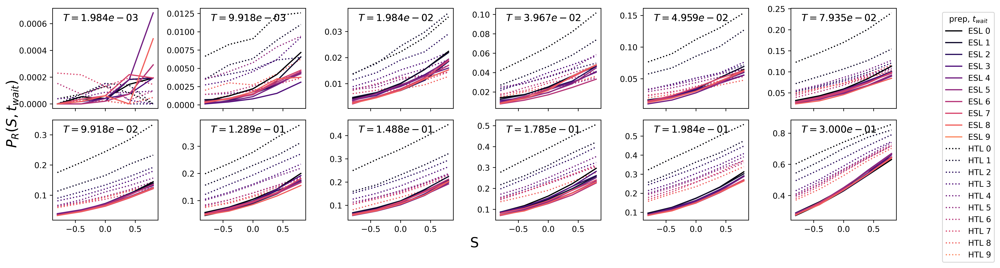

In [41]:
x = np.linspace(-1., 1., 6)
x2 = (x[1:] + x[:-1]) / 2
l = [f"{x:.2f}" for x in x2]
l.insert(0, "-inf")
l.append("inf")
y = np.geomspace(1e-4, 100, 50)
bins = [x, y]
df: pl.DataFrame

# shear = 0.03
# temp = 0.019836

cmap = cm.magma
norm = colors.Normalize(vmin=0, vmax=12)

# shears = [0.01, 0.02, 0.03, 0.12]
# tpre = ["100", "10"]

fig, axs = plt.subplots(2, 6, figsize=(18, 5), sharex=True, sharey=False, dpi=300)

axs = axs.ravel()

plt.subplots_adjust(wspace=.15, hspace=0)

for i in range(12):
    # shear = shears[i]
    temp = temps[i]
    # tp = tpre[j]
    plt.sca(axs[i])
    for sp, dfs in list(output.items()):

        if sp.temp != temp:
            continue
        
        # if sp.max_shear != shear:
        #     continue
        
        if sp.prep == "ESL":
            ls = "-"
        else:
            ls = ":"

        # df = dfs[0]
        # df = df.clone()
        # print(stats.pearsonr(df["soft"], df["d2min_c"]))
        # fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        

        for jdx in np.arange(0, 10):

            # xo = []
            # yo = []
            new_dfs = []
            for idx in np.arange(jdx, jdx+1, dtype=int):
                idx = int(idx)

                
                # print(idx)
                for kdx in range(len(dfs)):
                    new_dfs.append(dfs[kdx][idx])

            new_dfs = pl.concat(new_dfs)

            soft = new_dfs["soft"].explode()

            rev_d2min = new_dfs["d2min_irr"].explode()

            rearrange = rev_d2min > 0.08

            cuts = soft.cut(x, labels=l)

            df2 = pl.DataFrame(dict(
                soft=soft,
                d2min_rev=rev_d2min,
                rearrange=rearrange,
                cuts=cuts
            ))

            xs = []
            ys = []

            for cut, cdf in df2.group_by("cuts"):
                if "inf" in cut:
                    continue
                ave = cdf["rearrange"].mean()
                val = float(cut)
                xs.append(val)
                ys.append(ave)
            if len(xs) == 0:
                continue
            xs, ys = zip(*sorted(zip(xs, ys)))

            c = cmap(norm(jdx))

            plt.plot(xs, ys, ls, color=c)
            # if i == 3:
            #     x1 = 0.3
            #     y = 0.1
            # else:
            x1 = 0.1
            y = 0.9
            plt.text(x1, y, fr"$T={temp:.3e}$", transform=plt.gca().transAxes, va="center", size="large")

            # if jdx == 15:
            #     fit = np.polyfit(xs, ys, 1)
            #     print(fit, sp.prep)
            #     plt.plot(xs, np.poly1d(fit)(xs), color="k", ls="--")

fig.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.ylabel(r"$P_R(S, t_{wait})$", size="xx-large")
plt.xlabel(r"S", size="xx-large")
for prep, ls in zip(["ESL", "HTL"], ["-", ":"]):
    for jdx in np.arange(0, 10, 1):
        c = cmap(norm(jdx))
        plt.plot([], [], ls, color=c, label=f"{prep} {jdx}")
        # if jdx == 15:
        #     plt.plot([], [], ls, color="k", label=prep)
    # plt.plot([], [], ls, color="k", label=prep)
plt.legend(title=r"prep, $t_{wait}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend

plt.tight_layout()
    
# plt.ylabel(r"$P_R(S, t_{wait})$", size="xx-large")
# plt.xlabel(r"S", size="xx-large")
# plt.legend(title=r"prep, $t_{wait}$", bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.text(0.1, 0.9, fr"$\frac{{1}}{{10}}T_g, \gamma_{{max}}={shear}$", transform=plt.gca().transAxes, va="center", size="xx-large")
# plt.savefig(f"paper-figure-prob-rearrange.png", dpi=300, bbox_inches="tight")

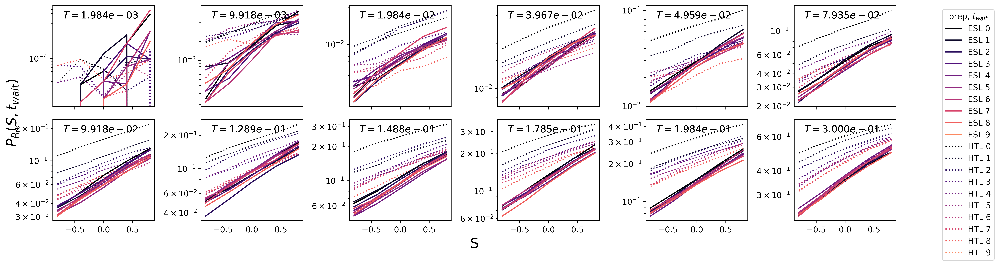

In [42]:
x = np.linspace(-1., 1., 6)
x2 = (x[1:] + x[:-1]) / 2
l = [f"{x:.2f}" for x in x2]
l.insert(0, "-inf")
l.append("inf")
y = np.geomspace(1e-4, 100, 50)
bins = [x, y]
df: pl.DataFrame

# shear = 0.03
# temp = 0.019836

cmap = cm.magma
norm = colors.Normalize(vmin=0, vmax=12)

# shears = [0.01, 0.02, 0.03, 0.12]
# tpre = ["100", "10"]

fig, axs = plt.subplots(2, 6, figsize=(18, 5), sharex=True, sharey=False, dpi=300)

axs = axs.ravel()

plt.subplots_adjust(wspace=.15, hspace=0)

for i in range(12):
    # shear = shears[i]
    temp = temps[i]
    # tp = tpre[j]
    plt.sca(axs[i])
    for sp, dfs in list(output.items()):

        if sp.temp != temp:
            continue
        
        # if sp.max_shear != shear:
        #     continue
        
        if sp.prep == "ESL":
            ls = "-"
        else:
            ls = ":"

        # df = dfs[0]
        # df = df.clone()
        # print(stats.pearsonr(df["soft"], df["d2min_c"]))
        # fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        

        for jdx in np.arange(0, 10):

            # xo = []
            # yo = []
            new_dfs = []
            for idx in np.arange(jdx, jdx+1, dtype=int):
                idx = int(idx)

                
                # print(idx)
                for kdx in range(len(dfs)):
                    new_dfs.append(dfs[kdx][idx])

            new_dfs = pl.concat(new_dfs)

            soft = new_dfs["soft"].explode()

            rev_d2min = new_dfs["d2min_rev"].explode()

            rearrange = rev_d2min > 0.08

            cuts = soft.cut(x, labels=l)

            df2 = pl.DataFrame(dict(
                soft=soft,
                d2min_rev=rev_d2min,
                rearrange=rearrange,
                cuts=cuts
            ))

            xs = []
            ys = []

            for cut, cdf in df2.group_by("cuts"):
                if "inf" in cut:
                    continue
                ave = cdf["rearrange"].mean()
                val = float(cut)
                xs.append(val)
                ys.append(ave)
            if len(xs) == 0:
                continue
            xs, ys = zip(*sorted(zip(xs, ys)))

            c = cmap(norm(jdx))

            plt.plot(xs, ys, ls, color=c)
            # if i == 3:
            #     x1 = 0.3
            #     y = 0.1
            # else:
            x1 = 0.1
            y = 0.9
            plt.text(x1, y, fr"$T={temp:.3e}$", transform=plt.gca().transAxes, va="center", size="large")
            plt.yscale('log')

            # if jdx == 15:
            #     fit = np.polyfit(xs, ys, 1)
            #     print(fit, sp.prep)
            #     plt.plot(xs, np.poly1d(fit)(xs), color="k", ls="--")

fig.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.ylabel(r"$P_R(S, t_{wait})$", size="xx-large")
plt.xlabel(r"S", size="xx-large")
for prep, ls in zip(["ESL", "HTL"], ["-", ":"]):
    for jdx in np.arange(0, 10, 1):
        c = cmap(norm(jdx))
        plt.plot([], [], ls, color=c, label=f"{prep} {jdx}")
        # if jdx == 15:
        #     plt.plot([], [], ls, color="k", label=prep)
    # plt.plot([], [], ls, color="k", label=prep)
plt.legend(title=r"prep, $t_{wait}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend

plt.tight_layout()
    
# plt.ylabel(r"$P_R(S, t_{wait})$", size="xx-large")
# plt.xlabel(r"S", size="xx-large")
# plt.legend(title=r"prep, $t_{wait}$", bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.text(0.1, 0.9, fr"$\frac{{1}}{{10}}T_g, \gamma_{{max}}={shear}$", transform=plt.gca().transAxes, va="center", size="xx-large")
# plt.savefig(f"paper-figure-prob-rearrange.png", dpi=300, bbox_inches="tight")

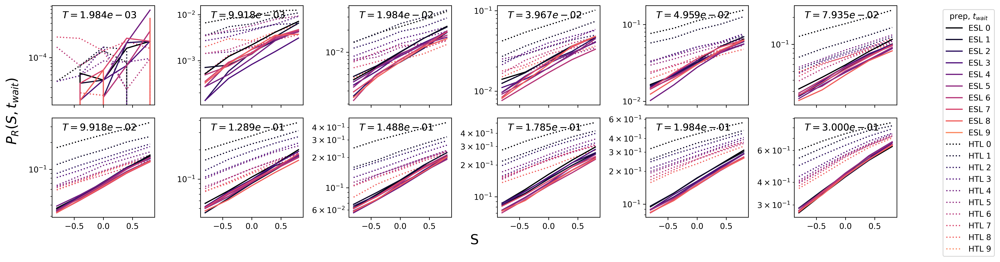

In [44]:
x = np.linspace(-1., 1., 6)
x2 = (x[1:] + x[:-1]) / 2
l = [f"{x:.2f}" for x in x2]
l.insert(0, "-inf")
l.append("inf")
y = np.geomspace(1e-4, 100, 50)
bins = [x, y]
df: pl.DataFrame

# shear = 0.03
# temp = 0.019836

cmap = cm.magma
norm = colors.Normalize(vmin=0, vmax=12)

# shears = [0.01, 0.02, 0.03, 0.12]
# tpre = ["100", "10"]

fig, axs = plt.subplots(2, 6, figsize=(18, 5), sharex=True, sharey=False, dpi=300)

axs = axs.ravel()

plt.subplots_adjust(wspace=.15, hspace=0)

for i in range(12):
    # shear = shears[i]
    temp = temps[i]
    # tp = tpre[j]
    plt.sca(axs[i])
    for sp, dfs in list(output.items()):

        if sp.temp != temp:
            continue
        
        # if sp.max_shear != shear:
        #     continue
        
        if sp.prep == "ESL":
            ls = "-"
        else:
            ls = ":"

        # df = dfs[0]
        # df = df.clone()
        # print(stats.pearsonr(df["soft"], df["d2min_c"]))
        # fig, axs = plt.subplots(1, 2, figsize=(12, 5))

        

        for jdx in np.arange(0, 10):

            # xo = []
            # yo = []
            new_dfs = []
            for idx in np.arange(jdx, jdx+1, dtype=int):
                idx = int(idx)

                
                # print(idx)
                for kdx in range(len(dfs)):
                    new_dfs.append(dfs[kdx][idx])

            new_dfs = pl.concat(new_dfs)

            soft = new_dfs["soft"].explode()

            rev_d2min = new_dfs["d2min_irr"].explode()

            rearrange = rev_d2min > 0.08

            cuts = soft.cut(x, labels=l)

            df2 = pl.DataFrame(dict(
                soft=soft,
                d2min_rev=rev_d2min,
                rearrange=rearrange,
                cuts=cuts
            ))

            xs = []
            ys = []

            for cut, cdf in df2.group_by("cuts"):
                if "inf" in cut:
                    continue
                ave = cdf["rearrange"].mean()
                val = float(cut)
                xs.append(val)
                ys.append(ave)
            if len(xs) == 0:
                continue
            xs, ys = zip(*sorted(zip(xs, ys)))

            c = cmap(norm(jdx))

            plt.plot(xs, ys, ls, color=c)
            # if i == 3:
            #     x1 = 0.3
            #     y = 0.1
            # else:
            x1 = 0.1
            y = 0.9
            plt.text(x1, y, fr"$T={temp:.3e}$", transform=plt.gca().transAxes, va="center", size="large")
            plt.yscale('log')

            # if jdx == 15:
            #     fit = np.polyfit(xs, ys, 1)
            #     print(fit, sp.prep)
            #     plt.plot(xs, np.poly1d(fit)(xs), color="k", ls="--")

fig.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.ylabel(r"$P_R(S, t_{wait})$", size="xx-large")
plt.xlabel(r"S", size="xx-large")
for prep, ls in zip(["ESL", "HTL"], ["-", ":"]):
    for jdx in np.arange(0, 10, 1):
        c = cmap(norm(jdx))
        plt.plot([], [], ls, color=c, label=f"{prep} {jdx}")
        # if jdx == 15:
        #     plt.plot([], [], ls, color="k", label=prep)
    # plt.plot([], [], ls, color="k", label=prep)
plt.legend(title=r"prep, $t_{wait}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend

plt.tight_layout()
    
# plt.ylabel(r"$P_R(S, t_{wait})$", size="xx-large")
# plt.xlabel(r"S", size="xx-large")
# plt.legend(title=r"prep, $t_{wait}$", bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.text(0.1, 0.9, fr"$\frac{{1}}{{10}}T_g, \gamma_{{max}}={shear}$", transform=plt.gca().transAxes, va="center", size="xx-large")
# plt.savefig(f"paper-figure-prob-rearrange.png", dpi=300, bbox_inches="tight")

In [18]:
def logit(x):
    return np.log(x / (1 - x))

[0.11712443 0.2902485 ] HTL
[0.15419869 0.30778771] ESL


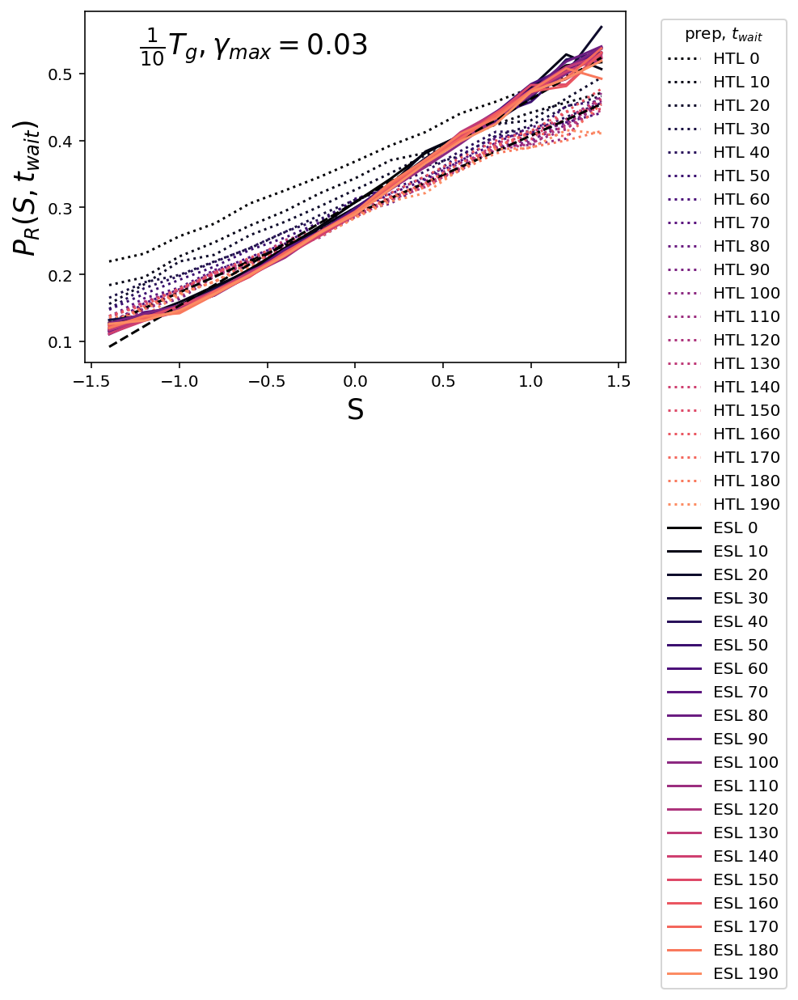

In [23]:
x = np.linspace(-1.5, 1.5, 16)
x2 = (x[1:] + x[:-1]) / 2
l = [f"{x:.2f}" for x in x2]
l.insert(0, "-inf")
l.append("inf")
y = np.geomspace(1e-4, 100, 50)
bins = [x, y]
df: pl.DataFrame

shear = 0.03
temp = 0.019836

cmap = cm.magma
norm = colors.Normalize(vmin=0, vmax=25)

for sp, dfs in list(output.items()):

    if sp.temp != temp:
        continue
    
    if sp.max_shear != shear:
        continue
    
    if sp.prep == "ESL":
        ls = "-"
    else:
        ls = ":"

    # df = dfs[0]
    # df = df.clone()
    # print(stats.pearsonr(df["soft"], df["d2min_c"]))
    # fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    

    for jdx in np.arange(0, 20, 1):

        # xo = []
        # yo = []
        new_dfs = []
        for idx in np.arange(jdx, jdx+1, dtype=int):
            idx = int(idx)

            
            # print(idx)
            for kdx in range(len(dfs)):
                new_dfs.append(dfs[kdx][idx])

        new_dfs = pl.concat(new_dfs)

        soft = new_dfs["soft"].explode()

        rev_d2min = new_dfs["d2min_rev"].explode()

        rearrange = rev_d2min > 0.08

        cuts = soft.cut(x, labels=l)

        df2 = pl.DataFrame(dict(
            soft=soft,
            d2min_rev=rev_d2min,
            rearrange=rearrange,
            cuts=cuts
        ))

        xs = []
        ys = []

        for cut, cdf in df2.group_by("cuts"):
            if "inf" in cut:
                continue
            ave = cdf["rearrange"].mean()
            val = float(cut)
            xs.append(val)
            ys.append(ave)

        xs, ys = zip(*sorted(zip(xs, ys)))
        xs = np.array(xs)
        ys = np.array(ys)

        c = cmap(norm(jdx))

        plt.plot(xs, ys, ls, color=c, label=f"{sp.prep} {jdx*10}")

        if jdx == 15:
            fit = np.polyfit(xs, ys, 1)
            print(fit, sp.prep)
            plt.plot(xs, np.poly1d(fit)(xs), color="k", ls="--")

    
plt.ylabel(r"$P_R(S, t_{wait})$", size="xx-large")
plt.xlabel(r"S", size="xx-large")
plt.legend(title=r"prep, $t_{wait}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.text(0.1, 0.9, fr"$\frac{{1}}{{10}}T_g, \gamma_{{max}}={shear}$", transform=plt.gca().transAxes, va="center", size="xx-large")
plt.savefig(f"rearrange_{shear}_{temp}.png", dpi=300, bbox_inches="tight")

In [20]:
ys

(0.21941747572815534,
 0.2311284046692607,
 0.2570886358562179,
 0.2760038170740659,
 0.3059620596205962,
 0.32544351502895486,
 0.34589938834103107,
 0.36874476987447696,
 0.39249257609502597,
 0.4126786824114357,
 0.44054911801608976,
 0.4580160744500846,
 0.47842310188189485,
 0.4958875033165296,
 0.5378823529411765)

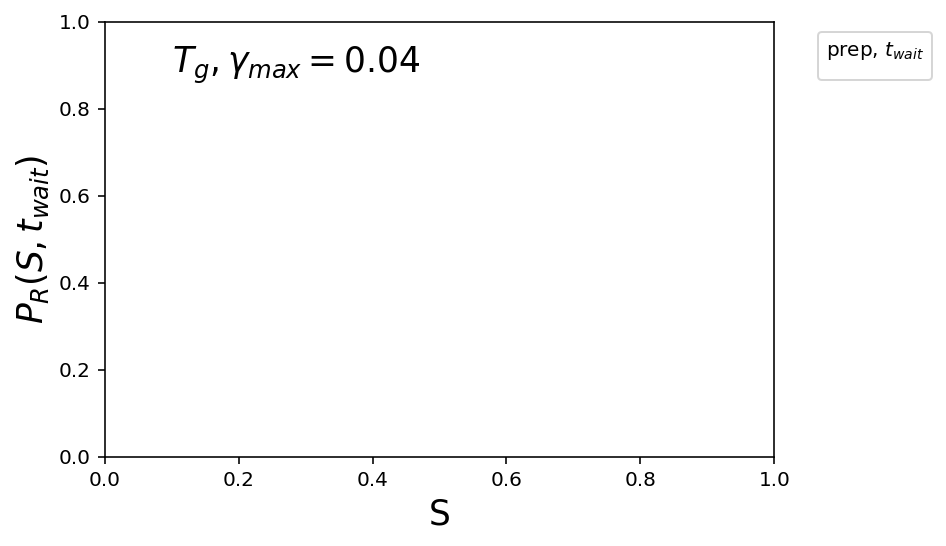

In [11]:
x = np.linspace(-1.0, 1.0, 11)
x2 = (x[1:] + x[:-1]) / 2
l = [f"{x:.2f}" for x in x2]
l.insert(0, "-inf")
l.append("inf")
y = np.geomspace(1e-4, 100, 50)
bins = [x, y]
df: pl.DataFrame

shear = 0.04
temp = 0.0019836

cmap = cm.magma
norm = colors.Normalize(vmin=0, vmax=20)

for sp, dfs in list(output.items()):

    if sp.temp != temp:
        continue
    
    if sp.max_shear != shear:
        continue
    
    if sp.prep == "ESL":
        ls = "-"
    else:
        ls = ":"

    # df = dfs[0]
    # df = df.clone()
    # print(stats.pearsonr(df["soft"], df["d2min_c"]))
    # fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    

    for jdx in [0, 5, 10, 15]:

        # xo = []
        # yo = []
        new_dfs = []
        for idx in np.arange(jdx, jdx+5, dtype=int):
            idx = int(idx)

            
            # print(idx)
            for kdx in range(len(dfs)):
                new_dfs.append(dfs[kdx][idx])

        new_dfs = pl.concat(new_dfs)

        soft = new_dfs["soft"].explode()

        rev_d2min = new_dfs["d2min_rev"].explode()

        rearrange = rev_d2min > 0.08

        cuts = soft.cut(x, labels=l)

        df2 = pl.DataFrame(dict(
            soft=soft,
            d2min_rev=rev_d2min,
            rearrange=rearrange,
            cuts=cuts
        ))

        xs = []
        ys = []

        for cut, cdf in df2.group_by("cuts"):
            if "inf" in cut:
                continue
            ave = cdf["rearrange"].mean()
            val = float(cut)
            xs.append(val)
            ys.append(ave)

        xs, ys = zip(*sorted(zip(xs, ys)))


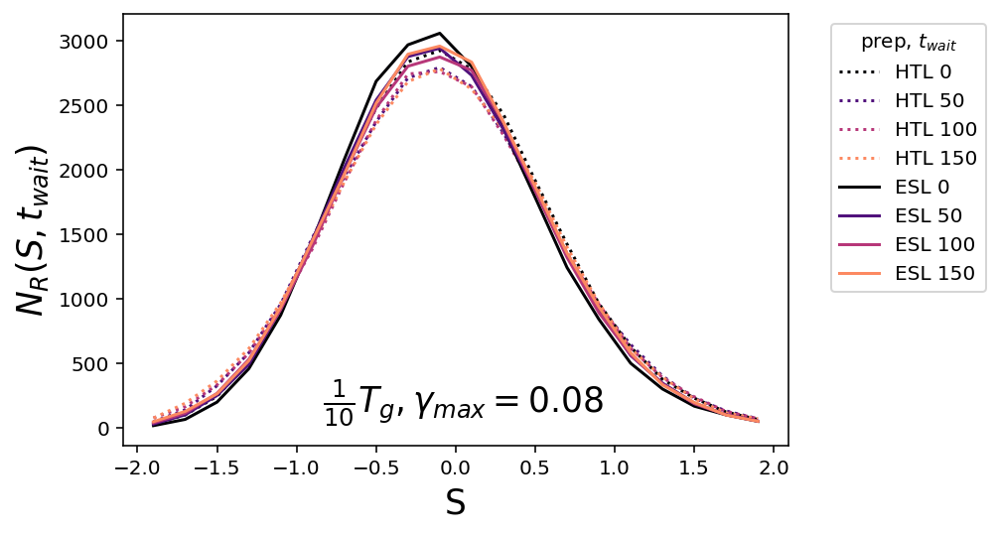

In [166]:
x = np.linspace(-2.0, 2.0, 21)
x2 = (x[1:] + x[:-1]) / 2
l = [f"{x:.2f}" for x in x2]
l.insert(0, "-inf")
l.append("inf")
y = np.geomspace(1e-4, 100, 50)
bins = [x, y]
df: pl.DataFrame

shear = 0.08
temp = 0.019836

cmap = cm.magma
norm = colors.Normalize(vmin=0, vmax=20)

for sp, dfs in list(output.items()):

    if sp.temp != temp:
        continue

    if sp.max_shear != shear:
        continue

    if sp.prep == "ESL":
        ls = "-"
    else:
        ls = ":"

    df = dfs[0]
    # df = df.clone()
    # print(stats.pearsonr(df["soft"], df["d2min_c"]))
    # fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    

    for jdx in [0, 5, 10, 15]:

        xo = []
        yo = []
        for idx in np.arange(jdx, jdx+5, dtype=int):
            idx = int(idx)
            # print(idx)

            soft = df["soft"][idx]

            rev_d2min = df["d2min_rev"][idx]

            rearrange = rev_d2min > 0.08

            cuts = soft.cut(x, labels=l)

            df2 = pl.DataFrame(dict(
                soft=soft,
                d2min_rev=rev_d2min,
                rearrange=rearrange,
                cuts=cuts
            ))

            # break

            xs = []
            ys = []

            for cut, cdf in df2.group_by("cuts"):
                if "inf" in cut:
                    continue
                ave = cdf["rearrange"].sum()
                val = float(cut)
                xs.append(val)
                ys.append(ave)

            xs, ys = zip(*sorted(zip(xs, ys)))

            xo.append(xs)
            yo.append(ys)

        c = cmap(norm(jdx))

        xs = np.array(xo).mean(axis=0)
        ys = np.array(yo).mean(axis=0)

        plt.plot(xs, ys, ls, color=c, label=f"{sp.prep} {jdx*10}")

    # break
        
 
    # axs[0].hist2d(, df["d2min_rev"][-1], bins=bins)
    # axs[1].hist2d(df["soft"][-1], df["d2min_irr"][-1], bins=bins)
    # corr1 = stats.pearsonr(df["soft"][-1], df["d2min_rev"][-1])
    # corr2 = stats.pearsonr(df["soft"][-1], df["d2min_irr"][-1])

    # axs[0].set_yscale('log')
    # axs[1].set_yscale('log')

    # for ax in axs:
    #     ax.set_xlabel("softness")
    # axs[0].set_ylabel("d2min_rev")
    # axs[0].set_title(f"corr={corr1[0]:.2f}, p={corr1[1]:.2f}")
    # axs[1].set_ylabel("d2min_irr")
    # axs[1].set_title(f"corr={corr2[0]:.2f}, p={corr2[1]:.2f}")
    # plt.suptitle(f"max_shear: {sp.max_shear}, prep: {sp.prep}, temp: {sp.temp}")
    # plt.show()
    # break
    
plt.ylabel(r"$N_R(S, t_{wait})$", size="xx-large")
plt.xlabel(r"S", size="xx-large")
plt.legend(title=r"prep, $t_{wait}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.text(0.3, 0.1, fr"$\frac{{1}}{{10}}T_g, \gamma_{{max}}={shear}$", transform=plt.gca().transAxes, va="center", size="xx-large")
plt.savefig(f"n_rearrange_{shear}_{temp}.png", dpi=300, bbox_inches="tight")

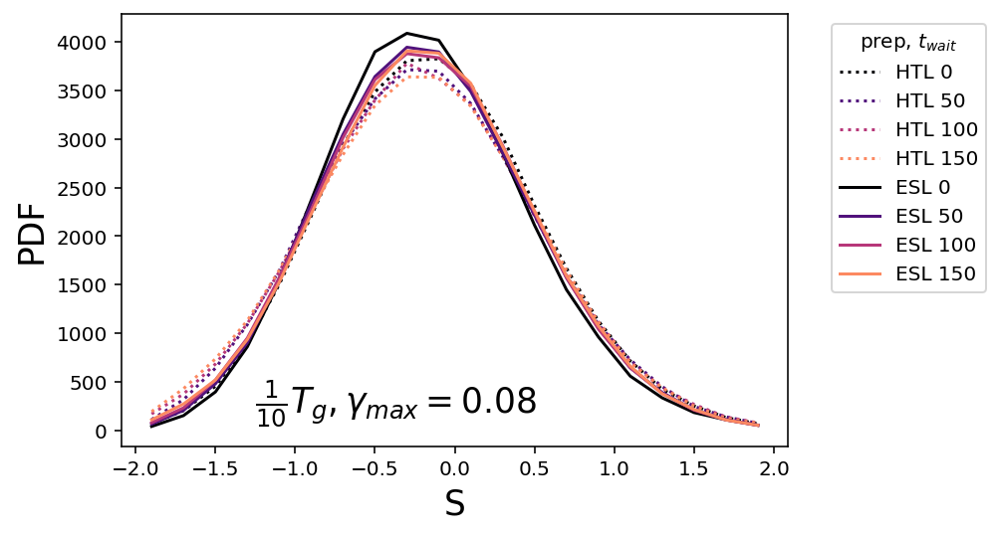

In [174]:
x = np.linspace(-2.0, 2.0, 21)
x2 = (x[1:] + x[:-1]) / 2
l = [f"{x:.2f}" for x in x2]
l.insert(0, "-inf")
l.append("inf")
y = np.geomspace(1e-4, 100, 50)
bins = [x, y]
df: pl.DataFrame

shear = 0.08
temp = 0.019836

cmap = cm.magma
norm = colors.Normalize(vmin=0, vmax=20)

for sp, dfs in list(output.items()):

    if sp.temp != temp:
        continue

    if sp.max_shear != shear:
        continue

    if sp.prep == "ESL":
        ls = "-"
    else:
        ls = ":"

    df = dfs[0]

    for jdx in [0, 5, 10, 15]:

        xo = []
        yo = []
        for idx in np.arange(jdx, jdx+5, dtype=int):
            idx = int(idx)
            # print(idx)

            soft = df["soft"][idx]

            rev_d2min = df["d2min_rev"][idx]

            rearrange = rev_d2min > 0.08

            cuts = soft.cut(x, labels=l)

            df2 = pl.DataFrame(dict(
                soft=soft,
                d2min_rev=rev_d2min,
                rearrange=rearrange,
                cuts=cuts
            ))

            # break

            xs = []
            ys = []

            for cut, cdf in df2.group_by("cuts"):
                if "inf" in cut:
                    continue
                ave = len(cdf["rearrange"])
                val = float(cut)
                xs.append(val)
                ys.append(ave)

            xs, ys = zip(*sorted(zip(xs, ys)))

            xo.append(xs)
            yo.append(ys)

        c = cmap(norm(jdx))

        xs = np.array(xo).mean(axis=0)
        ys = np.array(yo).mean(axis=0)

        plt.plot(xs, ys, ls, color=c, label=f"{sp.prep} {jdx*10}")

    
plt.ylabel(r"PDF", size="xx-large")
plt.xlabel(r"S", size="xx-large")
plt.legend(title=r"prep, $t_{wait}$", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.text(0.2, 0.1, fr"$\frac{{1}}{{10}}T_g, \gamma_{{max}}={shear}$", transform=plt.gca().transAxes, va="center", size="xx-large")
plt.savefig(f"soft_pdf_{shear}_{temp}.png", dpi=300, bbox_inches="tight")